In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
file  = '../data/AMOS/processed/20191216.csv'
data = pd.read_csv(file, index_col='LOCALDATE', parse_dates=True)
data = data.drop('LIGHTS', axis=1)
data[['RVR_1A', 'MOR_1A']] = data[['RVR_1A', 'MOR_1A']].apply(np.log10)
data['MOR_1A'] = data['MOR_1A'].apply(lambda x: max(0, x))
data.describe()

,RVR_1A,MOR_1A,PAINS,QNH AERODROME,QFE R06,TEMP,RH,DEWPOINT,WS2A,WD2A,CW2A
count,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000,5755.000000
mean,3.298781,3.362889,1019.271807,1020.815588,1019.251731,12.296803,81.698697,9.033618,3.466725,97.651781,2.213861
std,0.364982,0.726890,1.846957,1.850194,1.846920,2.704904,14.131424,0.915327,1.363013,33.417103,1.565325
min,2.301030,1.698970,1016.500000,1018.040000,1016.480000,7.400000,59.000000,7.060000,0.400000,1.000000,-0.980000
25%,3.477121,3.301030,1018.100000,1019.640000,1018.080000,10.000000,68.500000,8.320000,2.490000,81.000000,1.050000
50%,3.477121,3.698970,1019.100000,1020.650000,1019.080000,12.650000,81.000000,8.910000,3.540000,94.000000,2.120000
75%,3.477121,3.845098,1019.500000,1021.050000,1019.480000,14.700000,98.000000,9.910000,4.370000,114.000000,3.170000
max,3.477121,3.903090,1023.300000,1024.850000,1023.280000,16.300000,100.000000,10.910000,6.920000,359.000000,6.540000


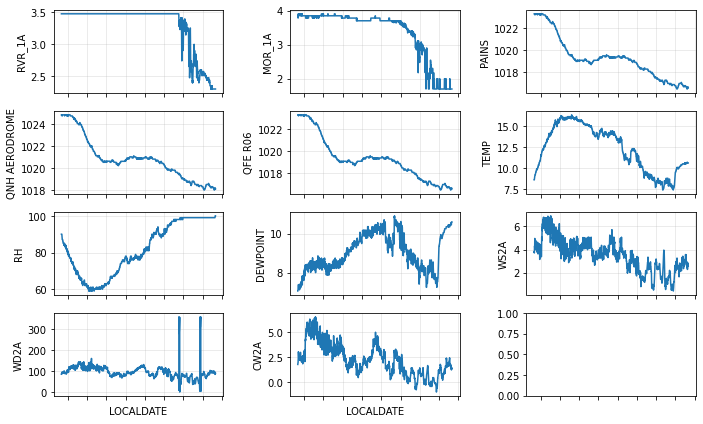

In [3]:
fig, ax = plt.subplots(4, 3, figsize=(10,6), sharex=True)
ax = ax.flatten()
for col, ax_i in zip(data.columns, ax):
    data[col].plot(ax=ax_i)
    ax_i.grid('--', alpha=.3)
    ax_i.set_ylabel(col)
    ax_i.set_xticklabels([])
ax[-1].set_xticklabels([])
plt.tight_layout()

观察因变量（RVR_1A，MOR_1A）与自变量的分布关系

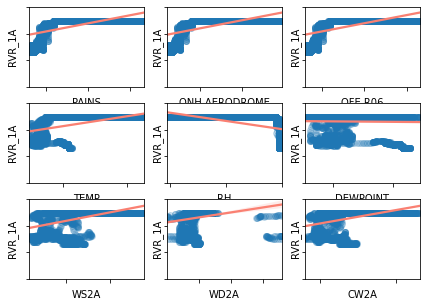

In [4]:
X = data.columns.drop(['RVR_1A', 'MOR_1A']).values.tolist()
fig, ax = plt.subplots(3, 3, sharey=True, figsize=(7,5))
for x, ax_i in zip(X, ax.flatten()):
    sns.regplot(x=x, y='RVR_1A', data=data, ax=ax_i, scatter_kws=dict(alpha=.2), line_kws=dict(color='salmon'))
    ax_i.set_ylim(1, 4)
    ax_i.set_xticklabels([])
    ax_i.set_yticklabels([])

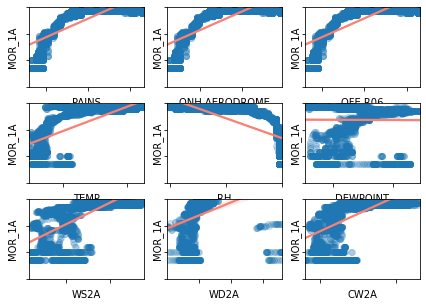

In [5]:
fig, ax = plt.subplots(3, 3, sharey=True, figsize=(7,5))
for x, ax_i in zip(X, ax.flatten()):
    sns.regplot(x=x, y='MOR_1A', data=data, ax=ax_i, scatter_kws=dict(alpha=.2), line_kws=dict(color='salmon'))
    ax_i.set_ylim(1, 4)
    ax_i.set_xticklabels([])
    ax_i.set_yticklabels([])

由于能见度具有观测上限，超过上限部分的能见度数据是不准确的。
这部分对探究能见度与地面气象之间的关系是没有意义的，反而在分析能见度与地表气象指标之间关系的过程中增加了噪声。
因此首先排除能见度超过xxx的数据，然后求各变量的相关关系

In [6]:
data = data[(data['RVR_1A'] <= 3) & (data['MOR_1A'] <= 3)]
data.describe()

,RVR_1A,MOR_1A,PAINS,QNH AERODROME,QFE R06,TEMP,RH,DEWPOINT,WS2A,WD2A,CW2A
count,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000,993.000000
mean,2.523835,1.876476,1016.913444,1018.453494,1016.893364,9.173152,99.014350,9.025408,2.094884,85.216516,0.775982
std,0.165061,0.239532,0.216964,0.216945,0.216945,1.147985,0.138788,1.151628,0.878881,52.792870,0.813891
min,2.301030,1.698970,1016.500000,1018.040000,1016.480000,7.400000,98.000000,7.250000,0.400000,4.000000,-0.980000
25%,2.397940,1.698970,1016.800000,1018.340000,1016.780000,8.070000,99.000000,7.920000,1.300000,64.000000,0.000000
50%,2.511883,1.698970,1016.900000,1018.440000,1016.880000,8.950000,99.000000,8.800000,2.250000,82.000000,0.830000
75%,2.602060,2.000000,1017.000000,1018.540000,1016.980000,10.400000,99.000000,10.250000,2.780000,92.000000,1.490000
max,3.000000,2.602060,1017.600000,1019.140000,1017.580000,10.700000,100.000000,10.600000,3.950000,359.000000,2.440000


In [7]:
data = data.drop(['RH'], axis=1)

<AxesSubplot:>

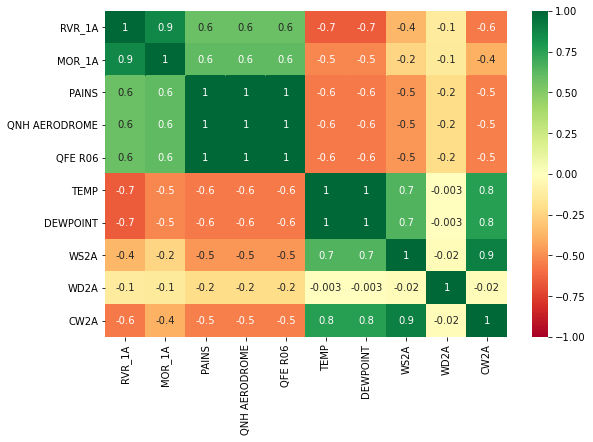

In [8]:
corr_metrix = data.corr()
fig, ax = plt.subplots(1, 1, figsize=(9,6))
sns.heatmap(corr_metrix, annot=True, vmax=1, vmin=-1, fmt='.1g', cmap="RdYlGn", ax=ax)

分别对两个因变量分析自变量与其的相关关系

In [9]:
rvr_corr = corr_metrix['RVR_1A'].drop(['RVR_1A','MOR_1A'])
mor_corr = corr_metrix['MOR_1A'].drop(['RVR_1A','MOR_1A'])
print(rvr_corr)
print(mor_corr)

PAINS            0.585222
QNH AERODROME    0.585224
QFE R06          0.585402
TEMP            -0.650928
DEWPOINT        -0.652758
WS2A            -0.363923
WD2A            -0.131623
CW2A            -0.557392
Name: RVR_1A, dtype: float64
PAINS            0.615169
QNH AERODROME    0.615175
QFE R06          0.615395
TEMP            -0.521381
DEWPOINT        -0.522248
WS2A            -0.236353
WD2A            -0.135058
CW2A            -0.387732
Name: MOR_1A, dtype: float64
